In [ ]:
!pip install split-folders

In [35]:
# import splitfolders
import os
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
from google.colab import drive

from sklearn.manifold import TSNE
from sklearn.metrics import confusion_matrix, classification_report

import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.models as models
from torch.utils.data import DataLoader
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from torch.utils.tensorboard import SummaryWriter

%matplotlib inline

In [2]:
# Mount Google Drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
DATASET_DIR = "/content/drive/MyDrive/AAI_Dataset/PlantVillage"

In [ ]:
# Split folder into train, test and validation set.
splitfolders.ratio('/content/drive/MyDrive/AAI_Dataset/PlantVillage/', output="/content/drive/MyDrive/AAI_Dataset/PlantVillage/", seed=1337, ratio=(0.8, 0.1, 0.1))

Copying files: 11227 files [05:28, 34.14 files/s]


In [4]:
train_dir = DATASET_DIR + "/train"
valid_dir = DATASET_DIR + "/valid"
diseases = os.listdir(train_dir)

diseases = [item for item in diseases if item not in {'train', 'val', 'test', 'spMohanty PlantVillage-Dataset master raw-color.zip', 'ResNet_PlantVillage.ipynb', 'Dataset.ipynb'}]

# Print dieases name
print(diseases)

['Blueberry___healthy', 'Apple___healthy', 'Apple___Cedar_apple_rust', 'Apple___Apple_scab', 'Apple___Black_rot', 'Cherry_(including_sour)___Powdery_mildew', 'Cherry_(including_sour)___healthy', 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot', 'Corn_(maize)___Common_rust_', 'Corn_(maize)___healthy', 'Corn_(maize)___Northern_Leaf_Blight', 'Grape___Black_rot', 'Grape___Esca_(Black_Measles)', 'Grape___healthy', 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 'Orange___Haunglongbing_(Citrus_greening)', 'Tomato___Bacterial_spot', 'Strawberry___healthy', 'Strawberry___Leaf_scorch', 'Squash___Powdery_mildew', 'Soybean___healthy', 'Raspberry___healthy', 'Potato___healthy', 'Potato___Late_blight', 'Potato___Early_blight', 'Pepper,_bell___healthy', 'Pepper,_bell___Bacterial_spot', 'Peach___healthy', 'Peach___Bacterial_spot', 'Tomato___Early_blight', 'Tomato___Late_blight', 'Tomato___Leaf_Mold', 'Tomato___Tomato_Yellow_Leaf_Curl_Virus', 'Tomato___Target_Spot', 'Tomato___Septoria_leaf_spot', 'T

In [5]:
print(f"Total classes are: {len(diseases)}")

Total classes are: 38


In [6]:
# Count the number of unique plants and disease
plants = set()

number_of_diseases = 0

for plant in diseases:
    plant_name, condition = plant.split('___')
    plant_name = plant_name.replace('_', ' ').replace(', ', ' ').title()
    plants.add(plant_name)
    if condition != 'healthy':
        number_of_diseases += 1

plants = list(plants)

In [7]:
# Unique plants
print(f"Number of unique plants are: \n{plants}")

Number of unique plants are: 
['Grape', 'Tomato', 'Apple', 'Peach', 'Squash', 'Pepper Bell', 'Cherry (Including Sour)', 'Blueberry', 'Orange', 'Potato', 'Raspberry', 'Corn (Maize)', 'Strawberry', 'Soybean']


In [8]:
# Unique plants count
print(f"Number of unique plants: {len(plants)}")

Number of unique plants: 14


In [9]:
# Unique unique disease count
print(f"Number of unique disease: {number_of_diseases}")

Number of unique disease: 26


In [10]:
nums = {disease: len(os.listdir(os.path.join(train_dir, disease))) for disease in diseases}

# Converting the nums dictionary to pandas DataFrame with plant name as index and number of images as column
img_per_class = pd.DataFrame(nums.values(), index=nums.keys(), columns=["No. of images"])

img_per_class

,No. of images
Blueberry___healthy,240
Apple___healthy,240
Apple___Cedar_apple_rust,220
Apple___Apple_scab,240
Apple___Black_rot,240
Cherry_(including_sour)___Powdery_mildew,240
Cherry_(including_sour)___healthy,240
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot,240
Corn_(maize)___Common_rust_,240
Corn_(maize)___healthy,240


In [11]:
sum([len(os.listdir(os.path.join(train_dir, disease))) for disease in diseases])

8981

<ipython-input-12-fb203da1fe06>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=img_per_class, x=img_per_class.index, palette="viridis")


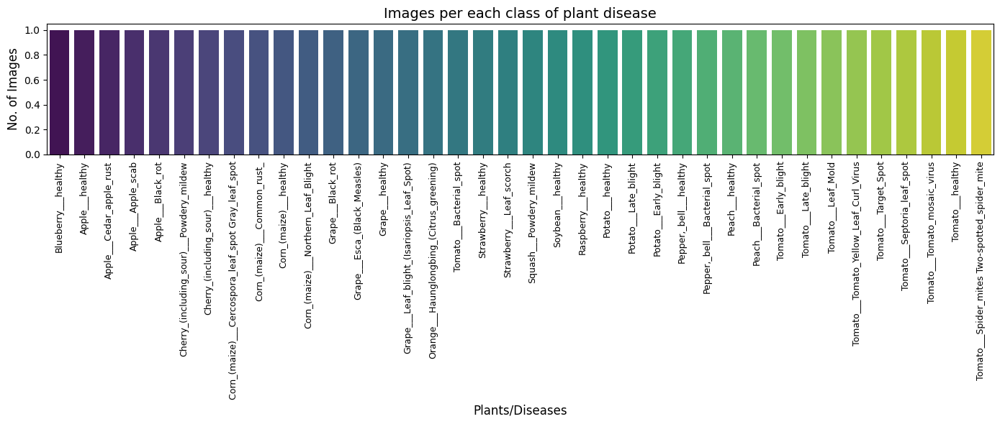

In [12]:
plt.figure(figsize=(14, 6))
sns.countplot(data=img_per_class, x=img_per_class.index, palette="viridis")
plt.xlabel('Plants/Diseases', fontsize=12)
plt.ylabel('No. of Images', fontsize=12)
plt.xticks(rotation=90, fontsize=9)
plt.title('Images per each class of plant disease', fontsize=14)
plt.tight_layout()
plt.show()

In [13]:
train_transforms = transforms.Compose([
    transforms.RandomResizedCrop(224),
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
    transforms.RandomAffine(degrees=10, translate=(0.1, 0.1), scale=(0.8, 1.2)),
    transforms.RandomPerspective(distortion_scale=0.1),
    transforms.RandomGrayscale(p=0.1),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

val_transforms = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

In [14]:
batch_size=32

In [15]:
train_dataset = ImageFolder(root='/content/drive/MyDrive/AAI_Dataset/PlantVillage/train', transform=train_transforms)
val_dataset = ImageFolder(root='/content/drive/MyDrive/AAI_Dataset/PlantVillage/val', transform=val_transforms)
test_dataset = ImageFolder(root='/content/drive/MyDrive/AAI_Dataset/PlantVillage/test', transform=val_transforms)

In [16]:
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


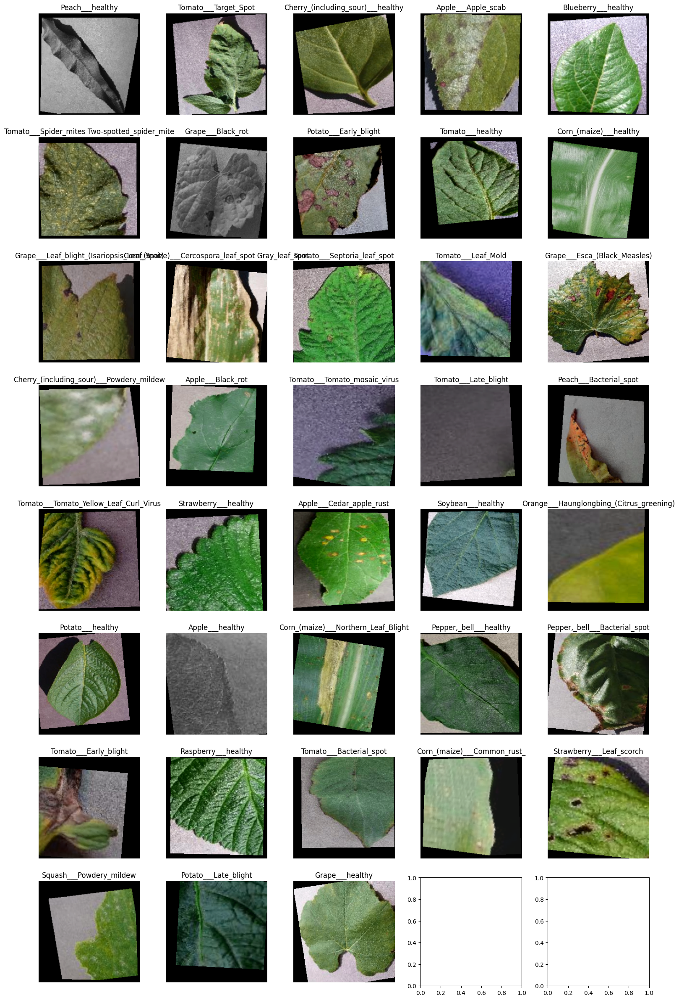

In [17]:
unique_classes = set()
class_to_idx = train_dataset.class_to_idx
idx_to_class = {v: k for k, v in class_to_idx.items()}

num_classes = len(class_to_idx)
num_rows = math.ceil(num_classes/5)
num_cols = min(5, num_classes)

fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(15, num_rows * 3))

row_index = 0
col_index = 0

for images, labels in train_loader:
    for image, label in zip(images, labels):
        class_name = idx_to_class[label.item()]
        if class_name not in unique_classes:
            unique_classes.add(class_name)
            ax = axes[row_index, col_index]
            img = image.numpy().transpose((1, 2, 0))
            mean = np.array([0.485, 0.456, 0.406])
            std = np.array([0.229, 0.224, 0.225])
            img = std * img + mean
            img = np.clip(img, 0, 1)

            ax.imshow(img)
            ax.set_title(class_name)
            ax.axis('off')

            col_index += 1
            if col_index == num_cols:
                col_index = 0
                row_index += 1

        if len(unique_classes) == num_classes:
            break
    if len(unique_classes) == num_classes:
        break

plt.tight_layout()
plt.show()

In [18]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f'Device: {device}')
model = models.mobilenet_v2(pretrained=True)
num_ftrs = model.classifier[1].in_features
model.classifier[1] = nn.Sequential(
    nn.Dropout(0.7),
    nn.Linear(num_ftrs, len(train_dataset.classes))
)
model.to(device)

Device: cpu


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V2_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V2_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/mobilenet_v2-b0353104.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v2-b0353104.pth
100%|██████████| 13.6M/13.6M [00:00<00:00, 37.7MB/s]


MobileNetV2(
  (features): Sequential(
    (0): Conv2dNormActivation(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU6(inplace=True)
    )
    (1): InvertedResidual(
      (conv): Sequential(
        (0): Conv2dNormActivation(
          (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
          (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (2): ReLU6(inplace=True)
        )
        (1): Conv2d(32, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
    )
    (2): InvertedResidual(
      (conv): Sequential(
        (0): Conv2dNormActivation(
          (0): Conv2d(16, 96, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (1): BatchNorm2d(96, eps=

In [23]:
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.001, weight_decay=1e-5, momentum=0.9)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', patience=5, verbose=True)

/usr/local/lib/python3.10/dist-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


In [20]:
TENSORBOARD_SUMMARY_PATH=f'{DATASET_DIR}/MobileNetV2_PlantVillage'
writer = SummaryWriter(TENSORBOARD_SUMMARY_PATH)

In [21]:
BEST_MODEL_PATH='/content/drive/MyDrive/AAI_Dataset/MobileNetV2_PlantVillage.pth'

In [22]:
early_stopping_patience = 5
epochs_no_improve = 0
val_loss_min = np.Inf

In [24]:
def train_model(num_epochs):
    global epochs_no_improve
    best_val_loss = float('inf')
    for epoch in range(num_epochs):
        # Train the model
        model.train()
        running_loss = 0.0
        correct = 0
        total = 0

        for images, labels in train_loader:
            images = images.to(device)
            labels = labels.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item() * images.size(0)
            _, predicted = torch.max(outputs, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

        epoch_loss = running_loss / total
        epoch_acc = correct / total
        writer.add_scalar('Training loss', epoch_loss, epoch)
        writer.add_scalar('Training accuracy', epoch_acc, epoch)

        # Validation
        model.eval()
        val_running_loss = 0.0
        val_correct = 0
        val_total = 0

        with torch.no_grad():
            for images, labels in val_loader:
                images = images.to(device)
                labels = labels.to(device)

                outputs = model(images)
                loss = criterion(outputs, labels)

                val_running_loss += loss.item() * images.size(0)
                _, predicted = torch.max(outputs, 1)
                val_total += labels.size(0)
                val_correct += (predicted == labels).sum().item()

        val_loss = val_running_loss / val_total
        val_accuracy = val_correct / val_total
        writer.add_scalar('Validation loss', val_loss, epoch)
        writer.add_scalar('Validation accuracy', val_accuracy, epoch)

        scheduler.step(val_loss)

        print(f'Epoch [{epoch+1}/{num_epochs}], '
              f'Train Loss: {epoch_loss:.4f}, Train Acc: {epoch_acc:.4f}, '
              f'Val Loss: {val_loss:.4f}, Val Acc: {val_accuracy:.4f}')

        if val_loss < best_val_loss:
            best_val_loss = val_loss
            epochs_no_improve = 0
            torch.save(model.state_dict(), BEST_MODEL_PATH)
        else:
            epochs_no_improve += 1

        if epochs_no_improve == early_stopping_patience:
            print('Early stopping initiated...')
            break

In [25]:
num_epochs = 10
train_model(num_epochs)

Epoch [1/10], Train Loss: 2.3401, Train Acc: 0.3594, Val Loss: 0.7379, Val Acc: 0.7959
Epoch [2/10], Train Loss: 1.0736, Train Acc: 0.6735, Val Loss: 0.3230, Val Acc: 0.8975
Epoch [3/10], Train Loss: 0.7723, Train Acc: 0.7621, Val Loss: 0.2654, Val Acc: 0.9135
Epoch [4/10], Train Loss: 0.6554, Train Acc: 0.7989, Val Loss: 0.2336, Val Acc: 0.9216
Epoch [5/10], Train Loss: 0.5929, Train Acc: 0.8127, Val Loss: 0.1689, Val Acc: 0.9394
Epoch [6/10], Train Loss: 0.5445, Train Acc: 0.8302, Val Loss: 0.1764, Val Acc: 0.9456
Epoch [7/10], Train Loss: 0.5057, Train Acc: 0.8418, Val Loss: 0.1489, Val Acc: 0.9537
Epoch [8/10], Train Loss: 0.4841, Train Acc: 0.8487, Val Loss: 0.1569, Val Acc: 0.9492
Epoch [9/10], Train Loss: 0.4287, Train Acc: 0.8663, Val Loss: 0.1444, Val Acc: 0.9456
Epoch [10/10], Train Loss: 0.4245, Train Acc: 0.8658, Val Loss: 0.1275, Val Acc: 0.9608


In [26]:
# Model evaluation
model.load_state_dict(torch.load(BEST_MODEL_PATH))
model.eval()
test_correct = 0
test_total = 0
all_targets = []
all_predictions = []

with torch.no_grad():
    for images, labels in test_loader:
        images = images.to(device)
        labels = labels.to(device)
        outputs = model(images)
        _, predicted = torch.max(outputs, 1)
        test_total += labels.size(0)
        test_correct += (predicted == labels).sum().item()
        all_targets.extend(labels.cpu().numpy())
        all_predictions.extend(predicted.cpu().numpy())

test_accuracy = test_correct / test_total
print(f'\n\nTest Accuracy: {test_accuracy:.4f}')

writer.close()



Test Accuracy: 0.9689


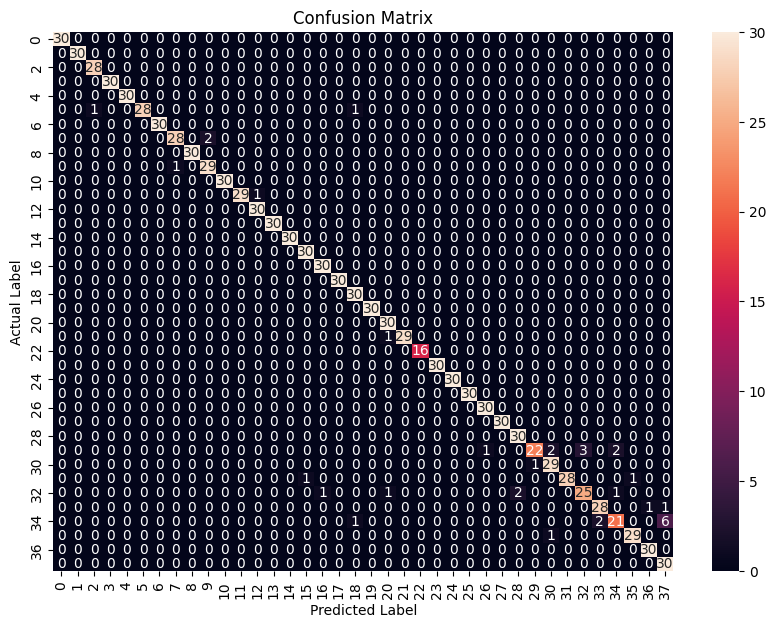

Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        30
           1       1.00      1.00      1.00        30
           2       0.97      1.00      0.98        28
           3       1.00      1.00      1.00        30
           4       1.00      1.00      1.00        30
           5       1.00      0.93      0.97        30
           6       1.00      1.00      1.00        30
           7       0.97      0.93      0.95        30
           8       1.00      1.00      1.00        30
           9       0.94      0.97      0.95        30
          10       1.00      1.00      1.00        30
          11       1.00      0.97      0.98        30
          12       0.97      1.00      0.98        30
          13       1.00      1.00      1.00        30
          14       1.00      1.00      1.00        30
          15       0.97      1.00      0.98        30
          16       0.97      1.00      0.98        30
    

In [36]:
conf_matrix = confusion_matrix(all_targets, all_predictions)

plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix, annot=True, fmt='g')
plt.title('Confusion Matrix')
plt.ylabel('Actual Label')
plt.xlabel('Predicted Label')
plt.show()

class_report = classification_report(all_targets, all_predictions)
print("Classification Report:")
print(class_report)

In [29]:
%load_ext tensorboard
%tensorboard
%tensorboard --logdir {TENSORBOARD_SUMMARY_PATH}

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


ERROR: Failed to launch TensorBoard (exited with 1).
Contents of stderr:
2024-03-20 21:30:27.106772: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-03-20 21:30:27.106961: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-03-20 21:30:27.109725: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-03-20 21:30:30.709993: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Error: A logdir or db must be specified. For example `tensorboard --logdir mylogdir` or `tensorboard --db sqlite:~/.tensorboard.db`. Run `tensorboard --helpfull` for de

<IPython.core.display.Javascript object>

In [32]:
from tensorboard.backend.event_processing.event_accumulator import EventAccumulator

# Create an EventAccumulator object for the SummaryWriter's log directory
event_acc = EventAccumulator(TENSORBOARD_SUMMARY_PATH)
event_acc.Reload()

# Get training and validation scalars
train_loss = [event.value for event in event_acc.Scalars('Training loss')]
train_accuracy = [event.value for event in event_acc.Scalars('Training accuracy')]
val_loss = [event.value for event in event_acc.Scalars('Validation loss')]
val_accuracy = [event.value for event in event_acc.Scalars('Validation accuracy')]

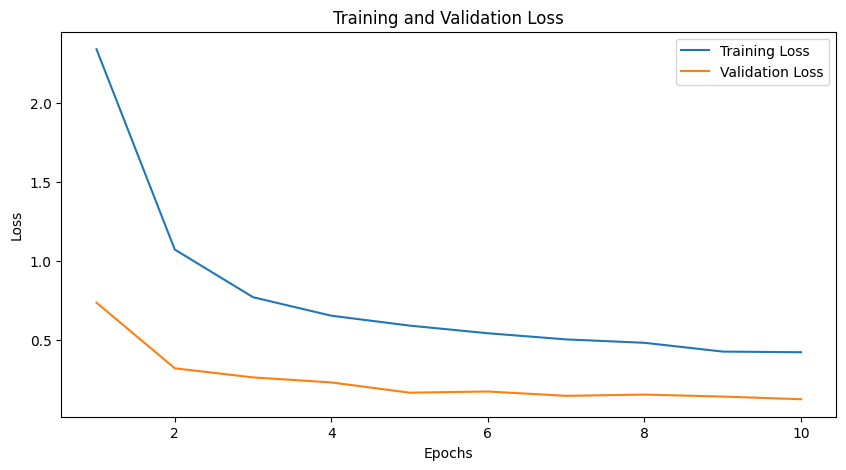

In [33]:
plt.figure(figsize=(10, 5))
sns.lineplot(x=range(1, len(train_loss) + 1), y=train_loss, label='Training Loss')
sns.lineplot(x=range(1, len(val_loss) + 1), y=val_loss, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

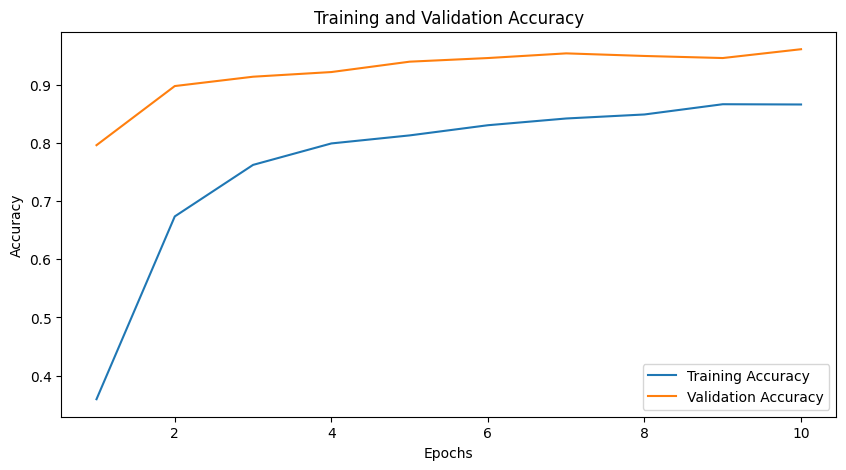

In [34]:
plt.figure(figsize=(10, 5))
sns.lineplot(x=range(1, len(train_accuracy) + 1), y=train_accuracy, label='Training Accuracy')
sns.lineplot(x=range(1, len(val_accuracy) + 1), y=val_accuracy, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()
plt.show()

In [37]:
def extract_features(loader, model, device):
    features = []
    targets = []
    model.eval()
    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)
            outputs = model(images)
            features.extend(outputs.cpu().numpy())
            targets.extend(labels.cpu().numpy())
    return np.array(features), np.array(targets)

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


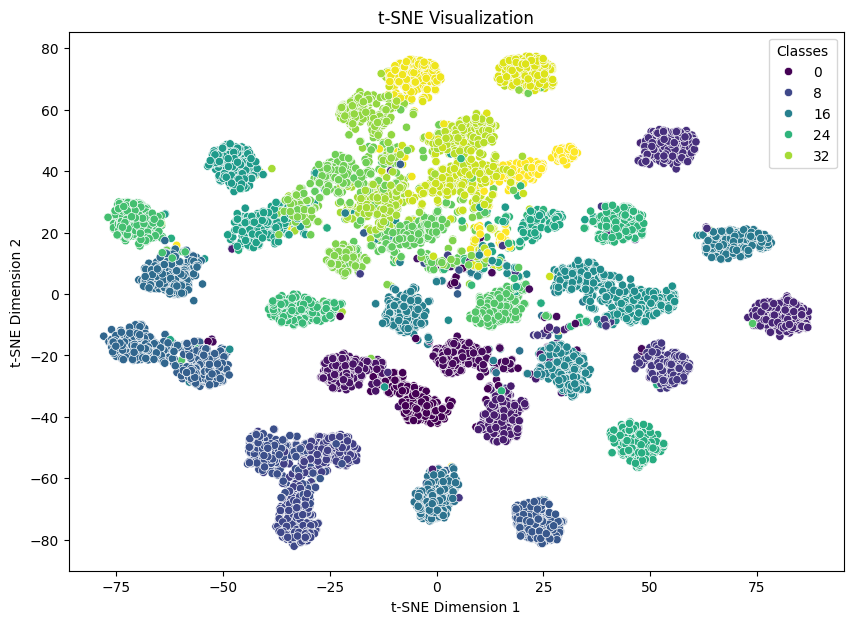

In [38]:
train_features, train_targets = extract_features(train_loader, model, device)
val_features, val_targets = extract_features(val_loader, model, device)

all_features = np.concatenate((train_features, val_features), axis=0)
all_targets = np.concatenate((train_targets, val_targets), axis=0)

tsne = TSNE(n_components=2, random_state=42)
tsne_features = tsne.fit_transform(all_features)

plt.figure(figsize=(10, 7))
sns.scatterplot(x=tsne_features[:, 0], y=tsne_features[:, 1], hue=all_targets, palette='viridis')
plt.title('t-SNE Visualization')
plt.xlabel('t-SNE Dimension 1')
plt.ylabel('t-SNE Dimension 2')
plt.legend(title='Classes')
plt.show()